# Task

With AI-modelling there is plenty of opportunity to improve processes or suggest improved ways of doing things. When doing so it is often very smart and efficient (time is a scarce resource) to create a POC (Proof of Concept) which basically is a small demo checking wether it is worthwile going further with something. It is also something concrete which facilitates discussions, do not underestimate the power of that. 

In this example, you are working in a company that sells houses and they have a "manual" process of setting prices by humans. You as a AI-modeller can make this process better by using Machine Learning. Your task is to create a POC that you will present to your team colleagues and use as a source of discussion of wether or not you should continue with more detailed modelling. 

Two quotes to facilitate your reflection on the value of creating a PoC: 

"*Premature optimization is the root of all evil*". 

"*Fail fast*".


**More specifially, do the following:**
1. A short EDA (Exploratory Data Analysis) of the housing data set.
2. Drop the column "ocean_proximity", then you only have numeric columns which will simplify your analysis. Remember, this is a POC!
3. Split your data into train, validation and test set. Before this, split your data into y and X. 
4. You have missing values in your data (not sure you do but you can assume so). Handle this with [ SimpleImputer(strategy="median") ], check the fantastic Scikit-learn documentation for details. Notice, the SimpleImputer should only be used for transformation on the validation and test data. Not fitting. 
5. Create one "Linear Regression" model and one "Lasso" model. For the Lasso model, use GridSearchCV to optimize $\alpha$ values, choose yourself which $\alpha$ values to evaluate.
Use RMSE as a metric to decide which model to choose. 

7. Which model is best on the validation data? 

8. Evaluate your chosen model on the test set using the root mean squared error (RMSE) as the metric. Conclusions? To be 100% right, you should re-fit your chosed model on the combination of train+val data. 

8. Do a short presentation (~ 2-5 min) on your POC that you present to your colleagues (no need to prepare anything particular, just talk from the code). Think of:
- What do you want to highlight/present?
- What is your conclusion?
- What could be the next step? Is the POC convincing enough or is it not worthwile continuing? Do we need to dig deeper into this before taking some decisions?

# Code

In [2]:
import numpy as np
import pandas as pd
pd.options.mode.copy_on_write = True
import matplotlib.pyplot as plt

from sklearn.pipeline import make_pipeline
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import StandardScaler,OrdinalEncoder,OneHotEncoder,FunctionTransformer
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import SimpleImputer,IterativeImputer
from sklearn import set_config
set_config(transform_output="pandas")


from sklearn.model_selection import GridSearchCV,train_test_split, cross_val_score
from sklearn.linear_model import LinearRegression, Lasso, Ridge, ElasticNet
from sklearn.ensemble import RandomForestRegressor

from sklearn.metrics import root_mean_squared_error, classification_report,confusion_matrix, ConfusionMatrixDisplay,r2_score, explained_variance_score
from sklearn.metrics import accuracy_score, mean_absolute_error, mean_squared_error, mean_absolute_percentage_error

import plotly.express as px

In [3]:
# Below, set your own path where you have stored the data file. 
housing_0 = pd.read_csv(r'housing.csv')
# us_cities = pd.read_csv("https://raw.githubusercontent.com/plotly/datasets/master/us-cities-top-1k.csv")

# housing_0.dropna(inplace=True)
fig = px.scatter_map(housing_0, lat="latitude", lon="longitude", hover_data=housing_0.columns, color="median_house_value",
                     color_continuous_scale=px.colors.sequential.Jet, size="total_rooms", zoom=6, height=1000, width=700)
fig.update_layout(map_style="open-street-map", title="California Housing Prices")


## Functions

In [4]:
def plot_vs_geo(df,col_str,title_str):
  df_sorted=df.sort_values(by=col_str,ascending=True) # Stack the plot order
  ax = df_sorted.plot( label=col_str,kind='scatter',x='longitude',y='latitude', alpha=0.4,s=4,c=col_str, colorbar=True)
  ax.set_title(title_str)

def plot_xcc(df):
  cc = df.corr()
  p = pd.plotting.scatter_matrix(df, diagonal='kde',alpha=0.4)
  # p = pd.plotting.scatter_matrix(df, diagonal='hist', alpha=0.4, hist_kwds={'bins': 150})

  # Add the correlation coefficients on the plot
  for i in range(len(p)):
    for j in range(len(p[i])):
      if j > i:
        p[i, j].annotate(f'Xcc={cc.iloc[i, j]:.2f}', (0.5, 0.05), xycoords='axes fraction', color='red', fontsize=9)

def plot_resize_cm(r,c):
  plt.gcf().set_size_inches(r/2.54,c/2.54)
  
def find_nans(df):
  # Find the NaNs
  nans = df.isna().sum()
  nans = nans[nans>0]
  return nans


# EDA
| Param | Meaning |
|:---|:---|
|longitude        |  A measure of how far west a house is; a higher value is farther west |
|latitude         |   A measure of how far north a house is; a higher value is farther north |
|housingMedianAge | Median age of a house within a block; a lower number is a newer building |
|totalRooms       | Total number of rooms within a block |
|totalBedrooms    | Total number of bedrooms within a block |
|population       | Total number of people residing within a block |
|households       | Total number of households, a group of people residing within a home unit, for a block |
|medianIncome     |   Median income for households within a block of houses (measured in tens of thousands of US Dollars) |
|medianHouseValue | Median house value for households within a block (measured in US Dollars) |
|oceanProximity  | Location of the house w.r.t ocean/sea |

In [5]:
housing_0.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY


In [6]:
housing_0.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20433 non-null  float64
 5   population          20640 non-null  float64
 6   households          20640 non-null  float64
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  float64
 9   ocean_proximity     20640 non-null  object 
dtypes: float64(9), object(1)
memory usage: 1.6+ MB


NaN's: total_bedrooms    207
dtype: int64


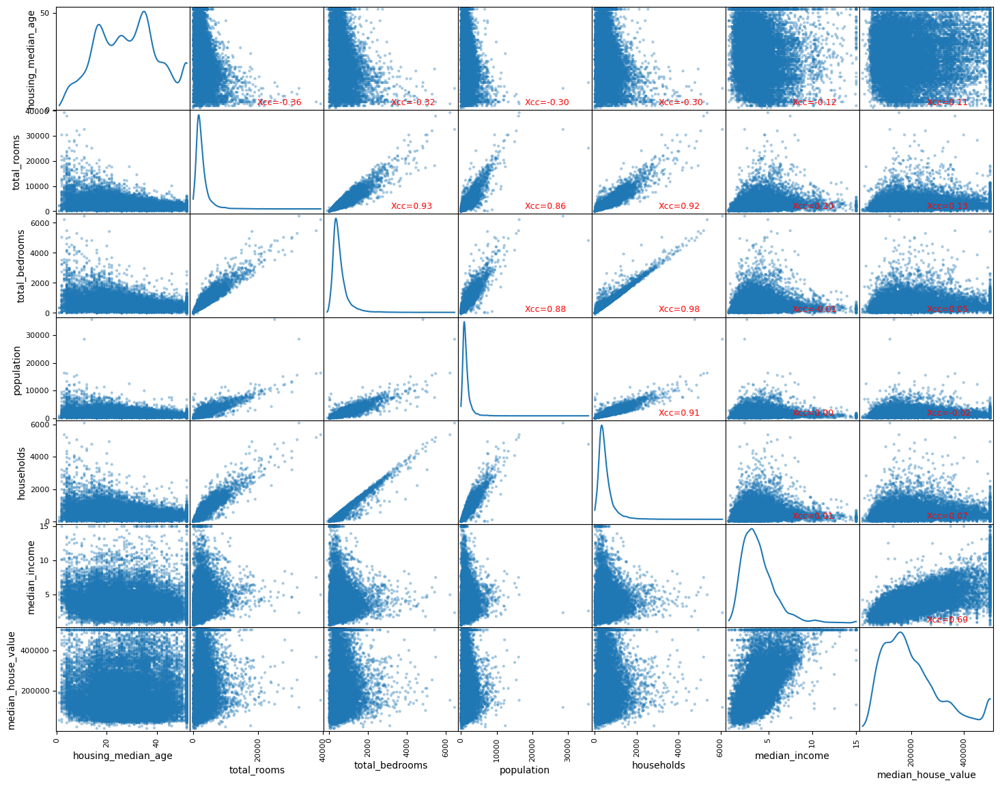

In [7]:
# Remove ocean_proximity column
housing = housing_0.select_dtypes(include=[np.number])

print(f"NaN's: {find_nans(housing)}")

# Transform rows with missing values using a multivariate transformer
imp = IterativeImputer(initial_strategy='median',max_iter=10, random_state=0)
housing = imp.fit_transform(housing)

plot_xcc(housing.drop(columns=['latitude','longitude'], axis=1))
plot_resize_cm(45,35)


## Clean/prepare the data

##### Helper functions/transformers

In [8]:

class CombinedAttributesAdder(BaseEstimator, TransformerMixin):
    '''Add new reelvant attributes and remove collinear ones'''
    def __init__(self):
      super().__init__()
    def fit(self, X, y=None):
      self.X = X
      return self
    def transform(self, X):
      X['rooms_per_household'] = X['total_rooms' ] / X['households']
      X['people_per_household'] = X[ 'population'] / X[ 'households']
      X['bedrooms_per_room'] = X[ 'total_bedrooms'] / X[ 'total_rooms']
      X = X.drop("total_rooms", axis=1)
      X = X.drop("total_bedrooms", axis=1)
      return X
    def set_output(self, transform='pandas'):
      pass

class FindMaxOutliers(BaseEstimator, TransformerMixin):
    '''Find outliers and markthem as NaN - remove then later'''
    def __init__(self,level, method = 'max'):
      super().__init__()
      self.method = method
      self.level = level
      self.threshold = 0 

    def fit(self, X, y=None):
      if self.method == 'quantile':
        self.threshold = X.quantile(self.level)
      else:
        self.threshold = self.level
      self.X = X
      return self
    def transform(self, X):
      X[X > self.threshold] = np.nan
      return X
    def set_output(self, transform='pandas'):
      pass

class PassTransformer(BaseEstimator, TransformerMixin):
    '''Pass through transformer'''
    def __init__(self):
      super().__init__()
    def fit(self, X, y=None):
      return self
    def transform(self, X):
      return X
    def set_output(self, transform='pandas'):
      pass


##### Remove outliers

NaN's:
median_house_value     965
housing_median_age    1321
population              21
households              21
dtype: int64
Will drop them ...


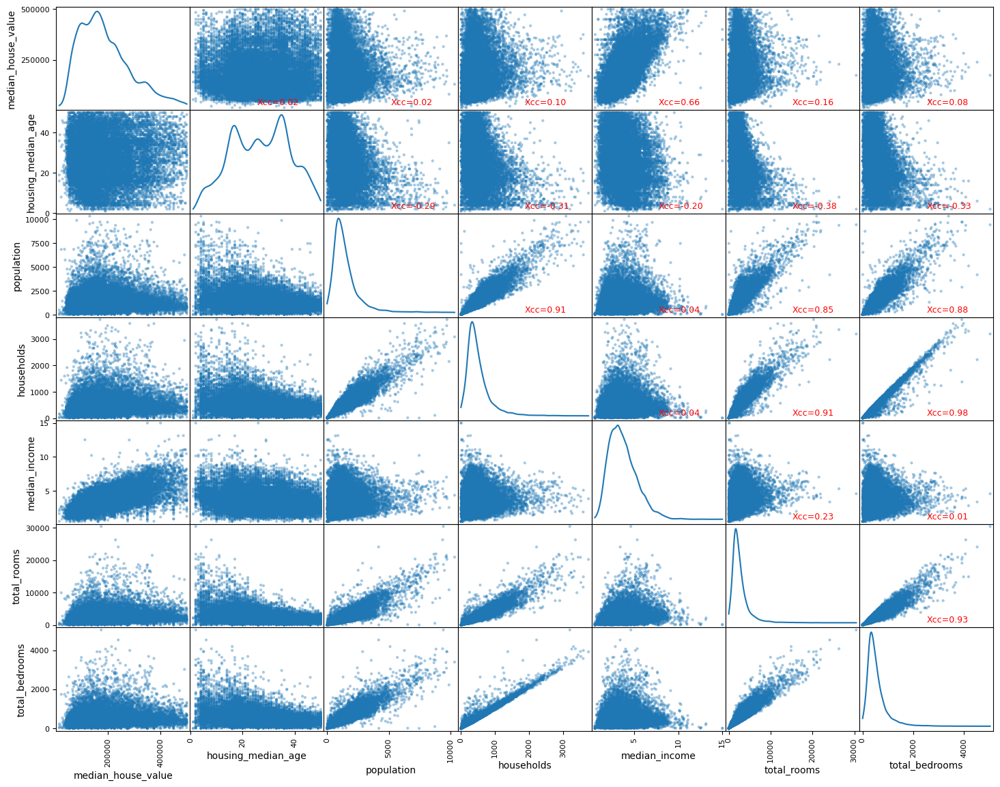

In [9]:

col_proc = make_column_transformer(
  (FindMaxOutliers(level=500000),['median_house_value']), 
  (FindMaxOutliers(level=50),['housing_median_age']), 
  (FindMaxOutliers(method='quantile', level=0.999),['population']),
  (FindMaxOutliers(method='quantile', level=0.999),['households']),
  (FindMaxOutliers(method='quantile', level=0.999),['median_income']),
  # (StandardScaler(),['median_income','median_house_value']),
  # (PassTransformer(),['total_rooms','total_bedrooms','population','households']),
  # (CombinedAttributesAdder(),['total_rooms','total_bedrooms','population','households']),
  remainder='passthrough',force_int_remainder_cols=False, verbose_feature_names_out=False)
housing = col_proc.fit_transform(housing)

print(f"NaN's:\n{find_nans(housing)}\nWill drop them ...")
housing.dropna(inplace=True)


plot_xcc(housing.drop(columns=['latitude','longitude'], axis=1))
plot_resize_cm(45,35)

##### Add new features

NaN's:
rooms_per_household     185
people_per_household    185
bedrooms_per_room       185
dtype: int64
Will drop them ...


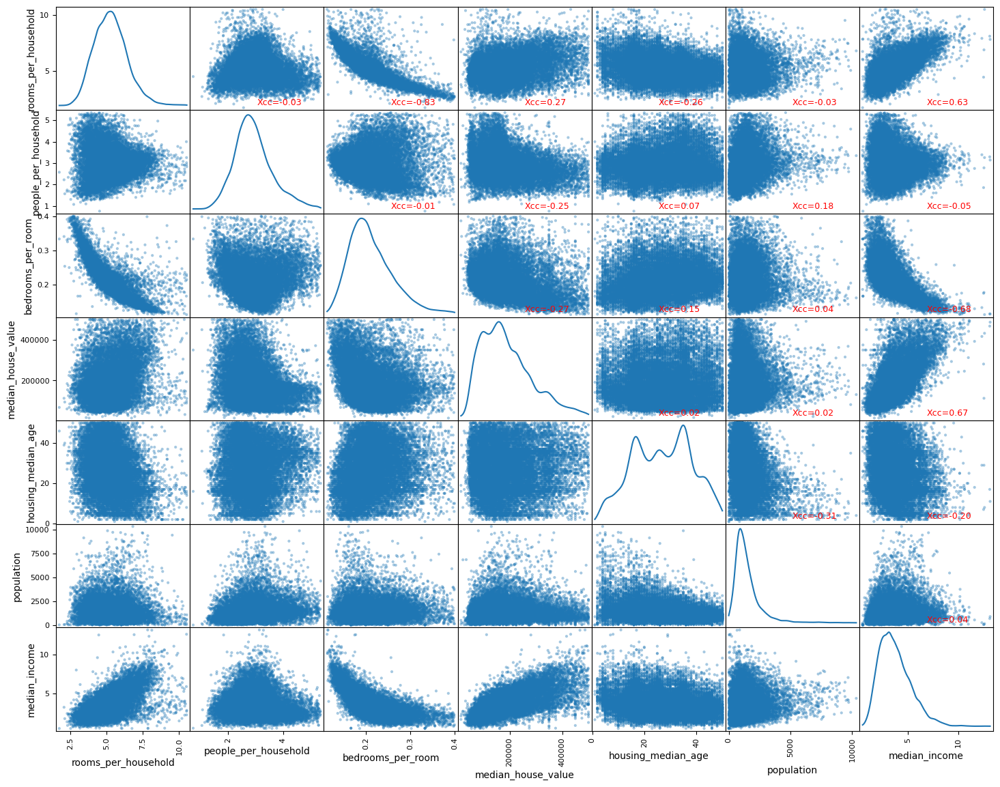

In [10]:
# Add new features
attr_adder = CombinedAttributesAdder()
housing_extra_attribs = attr_adder.fit_transform(housing)

# Remove housholds column - it is collinear with population
housing_extra_attribs = housing_extra_attribs.drop(columns=['households'], axis=1)

# Find outliers and mark them as NaN
col_proc = make_column_transformer(
  (FindMaxOutliers(method='quantile', level=0.99),['rooms_per_household']),
  (FindMaxOutliers(method='quantile', level=0.99),['people_per_household']),
  (FindMaxOutliers(method='quantile', level=0.99),['bedrooms_per_room']),
  remainder='passthrough',force_int_remainder_cols=False, verbose_feature_names_out=False)
housing_extra_attribs = col_proc.fit_transform(housing_extra_attribs)

print(f"NaN's:\n{find_nans(housing_extra_attribs)}\nWill drop them ...")
housing_extra_attribs.dropna(inplace=True)

plot_xcc(housing_extra_attribs.drop(columns=['latitude','longitude'], axis=1))
plot_resize_cm(45,35)

## Split data

NaN's:
Series([], dtype: int64)


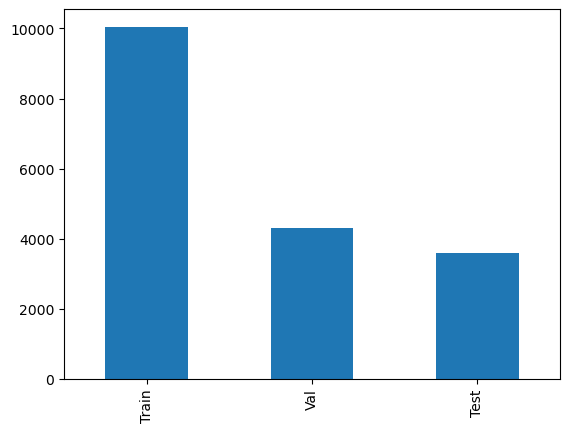

In [11]:
print(f"NaN's:\n{find_nans(housing_extra_attribs)}")
y = housing_extra_attribs.loc[:,housing_extra_attribs.columns == 'median_house_value']
X = housing_extra_attribs.loc[:,housing_extra_attribs.columns != 'median_house_value']

X_train_full, X_test, y_train_full, y_test = train_test_split(X, y, test_size=0.2, random_state=40)
X_train, X_val, y_train, y_val = train_test_split(X_train_full, y_train_full, test_size=0.3, random_state=36)

ax = pd.Series([X_train.shape[0], X_val.shape[0], X_test.shape[0]]).plot(kind='bar')
_=ax.set_xticklabels(['Train', 'Val', 'Test'])


### Clean/transform test and validation data

### Linear Regression

In [12]:

lin_reg = LinearRegression()
lin_reg.fit(X_train, y_train)

LinearRegression()

In [13]:
# Predict on the test set
lin_reg_pred_test = lin_reg.predict(X_test)

# print(f'Mean Square Error: {mean_squared_error(y_test, lin_reg_pred_test)}')
# print(f'R2 Score:          {r2_score(y_test, lin_reg_pred_test):>.4f}')
# print(f'Variance Score:    {explained_variance_score(y_test, lin_reg_pred_test):>.4f}')
print(f'Percentage Error:  {100*mean_absolute_percentage_error(y_test, lin_reg_pred_test):>8.2f} %')
print(f'RMSE:              {root_mean_squared_error(y_test, lin_reg_pred_test):>5.2f} $')



Percentage Error:     27.21 %
RMSE:              57157.49 $


### Lasso Regression

In [14]:

lasso = Lasso()
hyperparam_grid = {'alpha': [0.01, 0.1, 1, 10, 50, 100]}
grid_search = GridSearchCV(lasso, hyperparam_grid, scoring='neg_root_mean_squared_error', cv=5)
grid_search.fit(X_train, y_train)


GridSearchCV(cv=5, estimator=Lasso(),
             param_grid={'alpha': [0.01, 0.1, 1, 10, 50, 100]},
             scoring='neg_root_mean_squared_error')

In [15]:
print(f"Best : {grid_search.best_estimator_}")
pd.DataFrame(grid_search.cv_results_)

Best : Lasso(alpha=1)


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.017880,0.015530,0.006936,0.006875,0.01,{'alpha': 0.01},-55768.542517,-56294.210251,-54893.305801,-56188.035189,-56085.843767,-55845.987505,507.746281,3
1,0.016700,0.001526,0.000000,0.000000,0.10,{'alpha': 0.1},-55768.475147,-56294.239092,-54893.456380,-56187.967148,-56085.780865,-55845.983726,507.681815,2
2,0.016962,0.004154,0.001913,0.001535,1.00,{'alpha': 1},-55767.817824,-56294.540675,-54894.975131,-56187.302312,-56085.166494,-55845.960487,507.037940,1
3,0.013038,0.004714,0.001702,0.001535,10.00,{'alpha': 10},-55762.882209,-56298.877154,-54911.455811,-56182.211202,-56080.487525,-55847.182780,500.678440,4
4,0.009389,0.007751,0.003700,0.006467,50.00,{'alpha': 50},-55776.976748,-56347.173772,-55013.110038,-56193.850288,-56091.923861,-55884.606941,474.061375,5
5,0.012561,0.006380,0.003125,0.006250,100.00,{'alpha': 100},-55877.212756,-56474.000659,-55205.070875,-56286.976651,-56180.144720,-56004.681132,444.153982,6


In [16]:
# Retrain the model with the best hyperparameters
final = Lasso(alpha=grid_search.best_params_['alpha'])
final.fit(X_train_full, y_train_full)
pred_test = final.predict(X_test)

print(f'Percentage Error:  {100*mean_absolute_percentage_error(y_test, pred_test):>8.2f} %')
print(f'RMSE:              {root_mean_squared_error(y_test, pred_test):>5.2f} $')

Percentage Error:     27.21 %
RMSE:              57096.24 $


### Ridge Regression


In [17]:
ridge = Ridge()
hyperparam_grid = {'alpha': [0.01, 0.1, 1, 10, 50, 100]}
grid_search = GridSearchCV(ridge, hyperparam_grid, scoring='neg_root_mean_squared_error', cv=5)
grid_search.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': [0.01, 0.1, 1, 10, 50, 100]},
             scoring='neg_root_mean_squared_error')

In [18]:
print(f"Best : {grid_search.best_estimator_}")
pd.DataFrame(grid_search.cv_results_)

Best : Ridge(alpha=0.01)


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.011274,0.010991,0.005190,0.005870,0.01,{'alpha': 0.01},-55768.061516,-56294.477240,-54894.298739,-56187.606700,-56085.329438,-55845.954727,507.329329,1
1,0.003200,0.000401,0.002479,0.000450,0.10,{'alpha': 0.1},-55764.430738,-56297.373248,-54903.684658,-56184.405098,-56081.345889,-55846.247926,503.637756,2
2,0.001536,0.001909,0.004741,0.006125,1.00,{'alpha': 1},-55780.379843,-56356.798794,-55014.935918,-56201.726046,-56090.304495,-55888.829019,476.013236,3
3,0.004531,0.002596,0.003758,0.003908,10.00,{'alpha': 10},-56381.767223,-56993.178546,-55801.497757,-56782.897232,-56632.588304,-56518.385812,410.129190,4
4,0.002601,0.002335,0.004846,0.004147,50.00,{'alpha': 50},-56936.660566,-57512.689088,-56397.827925,-57295.393260,-57155.796552,-57059.673478,380.315216,5
5,0.002771,0.003925,0.000945,0.001890,100.00,{'alpha': 100},-57068.572717,-57619.464153,-56537.452861,-57388.904832,-57288.004353,-57180.479783,367.074005,6


In [19]:
# Retrain the model with the best hyperparameters
final = Lasso(alpha=grid_search.best_params_['alpha'])
final.fit(X_train_full, y_train_full)
pred_test = final.predict(X_test)

print(f'Percentage Error:  {100*mean_absolute_percentage_error(y_test, pred_test):>8.2f} %')
print(f'RMSE:              {root_mean_squared_error(y_test, pred_test):>5.2f} $')

Percentage Error:     27.21 %
RMSE:              57098.09 $


### Elastic Net Regression

In [20]:
elastic = ElasticNet()
hyperparam_grid = {'l1_ratio': [0.001, 0.01, 0.5, 0.99, 0.999], 'alpha': [0.1, 0.5, 1, 10]}
grid_search = GridSearchCV(elastic, hyperparam_grid, scoring='neg_root_mean_squared_error', cv=5)
grid_search.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=ElasticNet(),
             param_grid={'alpha': [0.1, 0.5, 1, 10],
                         'l1_ratio': [0.001, 0.01, 0.5, 0.99, 0.999]},
             scoring='neg_root_mean_squared_error')

In [21]:
print(f"Best : {grid_search.best_estimator_}")
pd.DataFrame(grid_search.cv_results_)

Best : ElasticNet(alpha=0.1, l1_ratio=0.999)


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,param_l1_ratio,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.009975,0.005807,0.005293,0.005131,0.1,0.001,"{'alpha': 0.1, 'l1_ratio': 0.001}",-57909.034515,-58193.316545,-57355.345044,-57800.040694,-58151.749164,-57881.897192,301.495003,10
1,0.014012,0.006123,0.000622,0.001245,0.1,0.010,"{'alpha': 0.1, 'l1_ratio': 0.01}",-57898.998860,-58185.706781,-57345.879781,-57793.768073,-58141.787974,-57873.228294,301.609552,9
2,0.013630,0.001898,0.001716,0.001588,0.1,0.500,"{'alpha': 0.1, 'l1_ratio': 0.5}",-57400.644074,-57828.535090,-56872.154975,-57519.046548,-57639.223595,-57451.920856,322.547435,8
3,0.016204,0.001139,0.000202,0.000405,0.1,0.990,"{'alpha': 0.1, 'l1_ratio': 0.99}",-56287.845114,-56901.783909,-55696.441791,-56692.810264,-56545.958403,-56424.967896,415.520082,3
4,0.009132,0.006054,0.007446,0.005928,0.1,0.999,"{'alpha': 0.1, 'l1_ratio': 0.999}",-55771.169926,-56340.776392,-54989.445390,-56192.539824,-56082.943597,-55875.375026,480.834000,1
5,0.009427,0.011138,0.006661,0.006465,0.5,0.001,"{'alpha': 0.5, 'l1_ratio': 0.001}",-62615.374374,-62199.073164,-61826.320101,-61515.434348,-62755.704514,-62182.381300,466.488787,14
6,0.009809,0.008378,0.004159,0.006819,0.5,0.010,"{'alpha': 0.5, 'l1_ratio': 0.01}",-62567.552456,-62156.418061,-61780.391264,-61474.172505,-62708.700208,-62137.446899,464.564890,13
7,0.009082,0.006370,0.003078,0.005214,0.5,0.500,"{'alpha': 0.5, 'l1_ratio': 0.5}",-59732.046315,-59679.843494,-59075.180121,-59123.019608,-59936.073404,-59509.232588,345.979517,12
8,0.009585,0.007833,0.003607,0.006080,0.5,0.990,"{'alpha': 0.5, 'l1_ratio': 0.99}",-56884.568132,-57466.593004,-56342.746923,-57251.487894,-57105.304665,-57010.140124,383.884430,5
9,0.015378,0.000706,0.001721,0.002107,0.5,0.999,"{'alpha': 0.5, 'l1_ratio': 0.999}",-56021.251142,-56634.904161,-55381.352219,-56435.786175,-56302.685980,-56155.195935,435.288291,2


In [22]:
# Retrain the model with the best hyperparameters
final = ElasticNet( alpha=grid_search.best_params_['alpha'], l1_ratio=grid_search.best_params_['l1_ratio'])
final.fit(X_train_full, y_train_full)
pred_test = final.predict(X_test)

print(f'Percentage Error:  {100*mean_absolute_percentage_error(y_test, pred_test):>8.2f} %')
print(f'RMSE:              {root_mean_squared_error(y_test, pred_test):>5.2f} $')


Percentage Error:     27.19 %
RMSE:              57041.15 $


In [23]:

sel_model = pred_test.reshape(-1,1)

# Convert X_test back to DataFrame
X_test_df = pd.DataFrame(X_test, columns=X.columns)

vsx_df = X_test_df.copy()
vsx_df['Actual'] = y_test
vsx_df['Predicted'] = sel_model
vsx_df['Diff'] = np.abs(y_test-sel_model)
vsx_df['Diff_pcnt'] = 100*np.abs(y_test-sel_model)/y_test
vsx_df['Diff_pcnt'] = vsx_df['Diff_pcnt'].clip(upper=200)

# fig = px.scatter_map(vsx_df, lat="latitude", lon="longitude", hover_data=vsx_df.columns, color="Diff", size="Actual",
#                     color_continuous_scale=px.colors.sequential.Jet, zoom=6, height=1000, width=700)
fig = px.scatter_map(vsx_df, lat="latitude", lon="longitude", hover_data=vsx_df.columns, color="Diff_pcnt", size="Actual",
                     color_continuous_scale=px.colors.sequential.Jet, zoom=6, height=1000, width=700, opacity=0.5) 
fig.update_layout(map_style="satellite-streets",title="California Housing Prices")
